In [5]:
import geopandas as gpd
final_merged_MLDT =  gpd.read_file(r"F:\NPP_PROJECT\USA_IN-SITU_WQ\USGS\USGS_continue_DO_match_era5_v3_local\usa_hydro_lake_point_all_1km2\all_result_csv_analysis\final_merged_MLDT.shp")
eco = gpd.read_file(r"F:\NPP_PROJECT\USA_IN-SITU_WQ\USGS\USGS_continue_DO_match_era5_v3_local\usa_hydro_lake_point_all_1km2\all_result_csv_analysis\Aggr_Ecoregions_2015.zip")
eco = eco.to_crs(epsg=4326)
eco 

,WSA9,WSA9_NAME,geometry
0,CPL,Coastal Plains,"MULTIPOLYGON (((-82.16236 24.56081, -82.16291 ..."
1,NAP,Northern Appalachians,"MULTIPOLYGON (((-76.09369 40.31498, -76.0841 4..."
2,NPL,Northern Plains,"POLYGON ((-97.84215 42.86814, -97.83997 42.867..."
3,SAP,Southern Appalachians,"MULTIPOLYGON (((-88.10888 37.76641, -88.10773 ..."
4,SPL,Southern Plains,"MULTIPOLYGON (((-95.8127 30.54779, -95.81262 3..."
5,TPL,Temperate Plains,"MULTIPOLYGON (((-82.63315 42.62777, -82.63292 ..."
6,UMW,Upper Midwest,"MULTIPOLYGON (((-87.30505 41.62051, -87.3049 4..."
7,WMT,Western Mountains,"MULTIPOLYGON (((-104.85317 31.8594, -104.85665..."
8,XER,Xeric,"MULTIPOLYGON (((-120.36912 34.07654, -120.3689..."


In [2]:
solpe_all 

,OID_,Hylak_id,Lake_name,Country,Continent,Poly_src,Lake_type,Grand_id,Lake_area,Shore_len,...,NEP_p,NEP_slope,GPP_mean,R_mean,NEP_mean,MLDT_Trend,MLDT_P,MLDT_Slope,MLDT_Mean,geometry
0,4,5,Superior,United States of America,North America,SWBD,1,0,81843.919999999998254,5248.359999999999673,...,0.482917,-0.052005,20.870529,19.279991,1.590538,no trend,0.081692,0.013870,7.565416,POINT (-84.46055 46.46859)
1,5,6,Michigan,United States of America,North America,SWBD,1,0,57726.839999999996508,2862.670000000000073,...,0.482917,0.011389,4.984640,5.944040,-0.959400,increasing,0.007768,0.022684,9.462931,POINT (-84.75391 45.82292)
2,6,7,Ontario,United States of America,North America,SWBD,3,1485,19347.360000000000582,2609.929999999999836,...,0.980698,0.001071,28.229834,32.243424,-4.013590,increasing,0.000240,0.022937,8.192027,POINT (-75.79425 44.48056)
3,7,8,Huron,United States of America,North America,SWBD,1,0,59399.300000000002910,8856.639999999999418,...,0.397117,-0.011818,5.869394,6.060421,-0.191027,increasing,0.026919,0.013945,9.733491,POINT (-82.42258 42.9994)
4,8,9,Erie,United States of America,North America,SWBD,1,0,25767.790000000000873,1935.519999999999982,...,0.827629,-0.008375,11.009067,12.096471,-1.087404,increasing,0.000850,0.018845,9.837691,POINT (-78.90808 42.90433)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6981,114694,114695,None,United States of America,North America,SWBD,1,0,8.220000000000001,39.390000000000001,...,0.467954,0.042038,25.555442,30.265188,-4.709746,increasing,0.000154,0.023118,23.330536,POINT (-81.02468 25.14716)
6982,115489,115490,None,United States of America,North America,SWBD,2,2255,1.160000000000000,11.410000000000000,...,0.566590,-0.149215,38.550746,36.326254,2.224492,increasing,0.000028,0.019576,24.251298,POINT (-66.66624 18.33373)
6983,115517,115518,None,United States of America,North America,SWBD,2,2256,1.910000000000000,12.340000000000000,...,0.042578,0.442164,23.556892,25.977758,-2.420866,increasing,0.000028,0.019576,24.251298,POINT (-66.6551 18.27566)
6984,115565,115566,None,United States of America,North America,SWBD,2,2257,2.100000000000000,12.199999999999999,...,0.058604,0.264316,24.919355,28.720717,-3.801362,increasing,0.000015,0.020160,25.120048,POINT (-66.48542 18.10208)


In [2]:
import numpy as np
# import xarray as xr
import pandas as pd
import string
import os
import pymannkendall as mk
# path =r'F:\NPP_PROJECT\USA_IN-SITU_WQ\USGS\USGS_continue_DO_match_era5_v3_local\usa_hydro_lake_point_all_1km2\all_result_csv_analysis'
path =r'F:\NPP_PROJECT\USA_IN-SITU_WQ\USGS\USGS_continue_DO_match_era5_v3_local\usa_hydro_lake_point_all_1km2\all_result_csv_analysis'
GPP_all = pd.read_csv(os.path.join(path,'all_lake_gpp_V2.csv'),index_col='time')
R_all = pd.read_csv(os.path.join(path,'all_lake_r_V2.csv'),index_col='time')
NEP_all = pd.read_csv(os.path.join(path,'all_lake_nep_V2.csv'),index_col='time')
# 3. 计算年均值
GPP_all.index = pd.to_datetime(GPP_all.index)
GPP_yearly = GPP_all.resample("Y").mean()
# GPP_yearly 
R_all.index = pd.to_datetime(R_all.index)
R_yearly = R_all.resample("Y").mean()

NEP_all.index = pd.to_datetime(NEP_all.index)
NEP_yearly = NEP_all.resample("Y").mean()

GPP_yearly_mean_one= GPP_yearly.mean(axis=1)
R_yearly_mean_one = R_yearly.mean(axis=1)
NEP_yearly_mean_one = NEP_yearly.mean(axis=1)
GPP_yearly_var_one = GPP_yearly.var(axis=1)
R_yearly_var_one = R_yearly.var(axis=1)
NEP_yearly_var_one = NEP_yearly.var(axis=1)

GPP_mouthly = GPP_all.resample("M").mean()
R_mouthly = R_all.resample("M").mean()
NEP_mouthly = NEP_all.resample("M").mean()

GPP_mouthly_mean_one=  GPP_mouthly.mean(axis=1)
R_mouthly_mean_one = R_mouthly.mean(axis=1)
NEP_mouthly_mean_one = NEP_mouthly.mean(axis=1)

GPP_mouthly_mean_one = pd.to_numeric(GPP_mouthly_mean_one, errors='coerce')
R_mouthly_mean_one = pd.to_numeric(R_mouthly_mean_one, errors='coerce')
NEP_mouthly_mean_one = pd.to_numeric(NEP_mouthly_mean_one, errors='coerce')

GPP_monthly_matrix = GPP_mouthly_mean_one.groupby([GPP_mouthly_mean_one.index.year, GPP_mouthly_mean_one.index.month]).mean().unstack()
R_monthly_matrix = R_mouthly_mean_one.groupby([R_mouthly_mean_one.index.year, R_mouthly_mean_one.index.month]).mean().unstack()
NEP_monthly_matrix = NEP_mouthly_mean_one.groupby([NEP_mouthly_mean_one.index.year,NEP_mouthly_mean_one.index.month]).mean().unstack()

C:\Users\Dell\AppData\Local\Temp\ipykernel_18576\3734538908.py:9: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  GPP_all = pd.read_csv(os.path.join(path,'all_lake_gpp_V2.csv'),index_col='time')
C:\Users\Dell\AppData\Local\Temp\ipykernel_18576\3734538908.py:10: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  R_all = pd.read_csv(os.path.join(path,'all_lake_r_V2.csv'),index_col='time')
C:\Users\Dell\AppData\Local\Temp\ipykernel_18576\3734538908.py:11: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  NEP_all = pd.read_csv(os.path.join(path,'all_lake_nep_V2.csv'),index_col='time')
C:\Users\Dell\AppData\Local\Temp\ipykernel_18576\3734538908.py:14: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  GPP_yearly = GPP_all.resample("Y").mean()
C:\Users\Dell\AppData\Local\Temp\ipykernel_18

In [8]:
from pymannkendall import original_test as mk_test
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import linregress
from matplotlib.colors import Normalize
# 创建 Mann-Kendall 趋势线（中值）和置信区间
def mann_kendall_ci(x, y, grid_x):
    result = mk_test(y)
    slope = result.slope
    intercept = np.median(y - slope * x)
    y_pred = slope * grid_x + intercept
    lower_pred = y_pred - np.std(y - (slope * x + intercept))  # 粗略表示置信带
    upper_pred = y_pred + np.std(y - (slope * x + intercept))
    return y_pred, lower_pred, upper_pred, slope, result.p
# 函数：设置p值格式
def format_p_value(p_val):
    if p_val < 0.001:
        return "P < 0.001"
    elif p_val < 0.01:
        return "P < 0.01"
    elif p_val < 0.05:
        return "P < 0.05"
    else:
        return f"P = {p_val:.2f}"

In [15]:
lakes_with_ecoregion = gpd.sjoin(final_merged_MLDT,eco , how='left', predicate='intersects')
lakes_with_ecoregion

,OID_,Hylak_id,Lake_name,Country,Continent,Poly_src,Lake_type,Grand_id,Lake_area,Shore_len,...,NEP_mean,MLDT_Trend,MLDT_P,MLDT_Slope,MLDT_Mean,geometry,index_right,WSA9,WSA9_NAME,color
0,4,5,Superior,United States of America,North America,SWBD,1,0,81843.919999999998254,5248.359999999999673,...,1.590538,no trend,0.081692,0.013870,7.565416,POINT (-84.46055 46.46859),NaN,NaN,NaN,NaN
1,5,6,Michigan,United States of America,North America,SWBD,1,0,57726.839999999996508,2862.670000000000073,...,-0.959400,increasing,0.007768,0.022684,9.462931,POINT (-84.75391 45.82292),NaN,NaN,NaN,NaN
2,6,7,Ontario,United States of America,North America,SWBD,3,1485,19347.360000000000582,2609.929999999999836,...,-4.013590,increasing,0.000240,0.022937,8.192027,POINT (-75.79425 44.48056),NaN,NaN,NaN,NaN
3,7,8,Huron,United States of America,North America,SWBD,1,0,59399.300000000002910,8856.639999999999418,...,-0.191027,increasing,0.026919,0.013945,9.733491,POINT (-82.42258 42.9994),NaN,NaN,NaN,NaN
4,8,9,Erie,United States of America,North America,SWBD,1,0,25767.790000000000873,1935.519999999999982,...,-1.087404,increasing,0.000850,0.018845,9.837691,POINT (-78.90808 42.90433),NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6981,114694,114695,None,United States of America,North America,SWBD,1,0,8.220000000000001,39.390000000000001,...,-4.709746,increasing,0.000154,0.023118,23.330536,POINT (-81.02468 25.14716),0.0,CPL,Coastal Plains,#A6CEE3
6982,115489,115490,None,United States of America,North America,SWBD,2,2255,1.160000000000000,11.410000000000000,...,2.224492,increasing,0.000028,0.019576,24.251298,POINT (-66.66624 18.33373),NaN,NaN,NaN,NaN
6983,115517,115518,None,United States of America,North America,SWBD,2,2256,1.910000000000000,12.340000000000000,...,-2.420866,increasing,0.000028,0.019576,24.251298,POINT (-66.6551 18.27566),NaN,NaN,NaN,NaN
6984,115565,115566,None,United States of America,North America,SWBD,2,2257,2.100000000000000,12.199999999999999,...,-3.801362,increasing,0.000015,0.020160,25.120048,POINT (-66.48542 18.10208),NaN,NaN,NaN,NaN


In [88]:
# 筛选数据（根据 GPP/R/NEP 显著性）
sig_gpp = lakes_with_ecoregion[(lakes_with_ecoregion['GPP_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]
sig_r = lakes_with_ecoregion[(lakes_with_ecoregion['R_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]
sig_nep = lakes_with_ecoregion[(lakes_with_ecoregion['NEP_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]

groups = sorted(sig_gpp['WSA9_NAME'].unique())[:10]

# 提取数据列表
def extract_data(df, col, groups):
    return [df.loc[df['WSA9_NAME'] == g, col].dropna() for g in groups]

gpp_mean_data = extract_data(sig_gpp, 'GPP_mean', groups)
gpp_slope_data = extract_data(sig_gpp, 'GPP_slope', groups)

r_mean_data = extract_data(sig_r, 'R_mean', groups)
r_slope_data = extract_data(sig_r, 'R_slope', groups)

nep_mean_data = extract_data(sig_nep, 'NEP_mean', groups)
nep_slope_data = extract_data(sig_nep, 'NEP_slope', groups)

In [23]:
def split_by_region(yearly_df, region_to_ids):
    yearly_df.columns = yearly_df.columns.astype(str)  # 保证列是字符串
    region_to_data = {}
    for region, ids in region_to_ids.items():
        ids_in_data = [i for i in ids if i in yearly_df.columns]
        if ids_in_data:
            region_to_data[region] = yearly_df[ids_in_data]
    return region_to_data
region_to_gpp_yearly = split_by_region(GPP_yearly, region_to_ids)
region_to_r_yearly   = split_by_region(R_yearly, region_to_ids)
region_to_nep_yearly = split_by_region(NEP_yearly, region_to_ids)
mean_all = {}
for region in region_to_gpp_yearly.keys():
    mean_all[region] = pd.DataFrame({
        'GPP': region_to_gpp_yearly[region].mean(axis=1),
        'R': region_to_r_yearly[region].mean(axis=1),
        'NEP': region_to_nep_yearly[region].mean(axis=1)
    })




,GPP,R,NEP
count,39.000000,39.000000,39.000000
mean,13.830590,15.460906,-1.630316
std,1.281718,1.258414,0.357811
min,11.834492,13.550861,-2.723592
25%,12.937223,14.739401,-1.897502
50%,13.450113,15.025598,-1.571418
75%,14.241090,16.047052,-1.470219
max,17.230677,19.954269,-0.967640


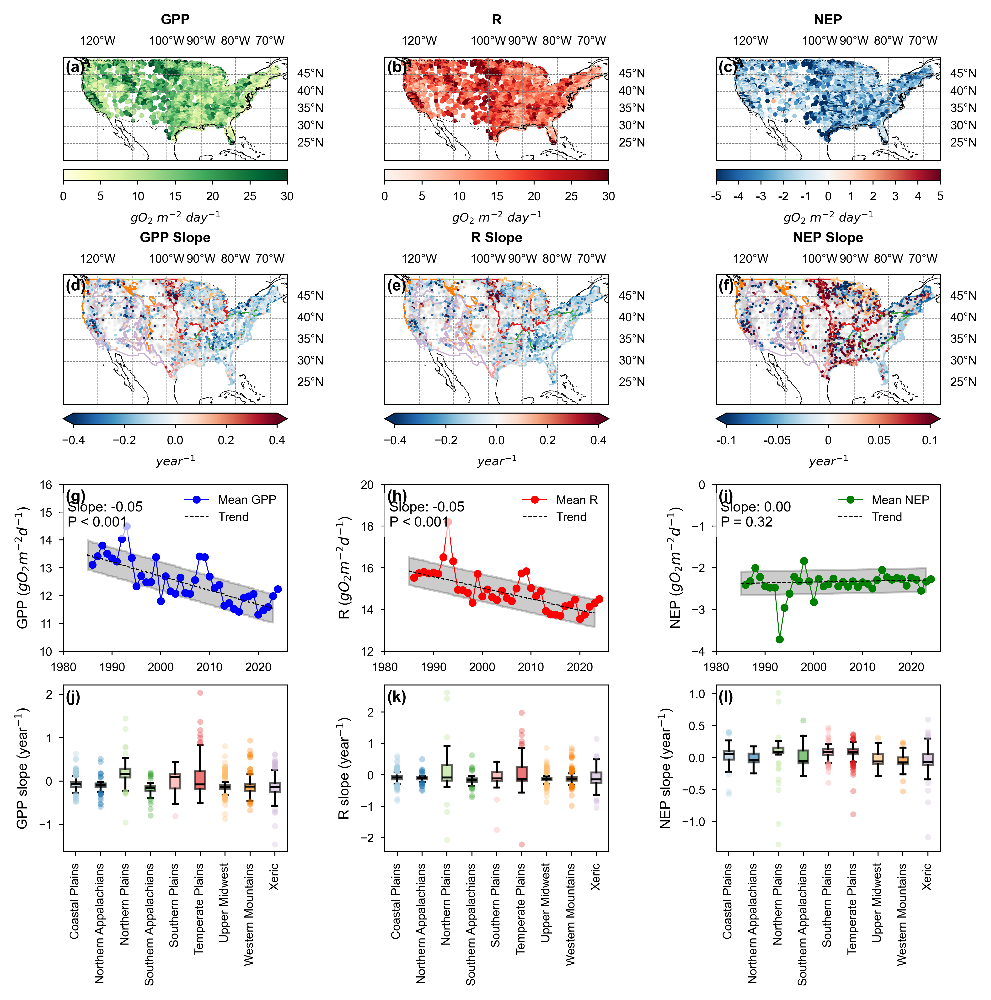

In [ ]:
# -*- coding: utf-8 -*-
from matplotlib.cm import ScalarMappable  
from matplotlib.colors import ListedColormap, BoundaryNorm,TwoSlopeNorm
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
import matplotlib.colors as mcolors
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 7,
    'axes.labelsize': 7,
    'axes.titlesize': 7,
    'xtick.labelsize': 6,
    'ytick.labelsize': 6,
    'legend.fontsize': 6,
    'figure.titlesize': 8,
    'lines.linewidth': 0.5,
    'axes.linewidth': 0.5,
    'xtick.major.width': 0.5,
    'ytick.major.width': 0.5,
    'xtick.major.size': 2,
    'ytick.major.size': 2
})

def plot_slope_box_by_ecoregion(ax, df, slope_col, groups, ecoregion_colors, y_label, panel_label):
    positions = np.arange(1, len(groups) + 1)
    
    # 为每个生态区准备数据和颜色
    data = [df.loc[df['WSA9_NAME'] == g, slope_col].dropna() for g in groups]
    box_colors = [ecoregion_colors.get(g, '#777777') for g in groups]  # 默认灰色
    
    # 逐组绘制箱线图，颜色分别设置
    for pos, d, color in zip(positions, data, box_colors):
        box = ax.boxplot(
            d, positions=[pos], widths=0.4,
            patch_artist=True,
            boxprops=dict(facecolor=color, alpha=0.6),
            medianprops=dict(color='black', linewidth=1.0),
            showcaps=True, showfliers=True,
            flierprops=dict(marker='o', markersize=3, linestyle='none',
                            markerfacecolor=color, markeredgecolor='none', alpha=0.3)
        )
    
    ax.set_ylabel(y_label)
    ax.set_xticks(positions)
    ax.set_xticklabels(groups, rotation=90, ha='center')
    ax.grid(False)

fig = plt.figure(figsize=(6.8, 7), dpi=600,constrained_layout=True)
axdict = fig.subplot_mosaic(
    """
    ABC
    DEF
    GHI
    JKL
    """,
    per_subplot_kw={
        'A': {'projection': ccrs.PlateCarree()},
        'B': {'projection': ccrs.PlateCarree()},
        'C': {'projection': ccrs.PlateCarree()},
        'D': {'projection': ccrs.PlateCarree()},
        'E': {'projection': ccrs.PlateCarree()},
        'F': {'projection': ccrs.PlateCarree()}
        # G–L 不指定 projection，默认使用普通 2D axes
    },
)

titles = {
    'A': 'GPP',
    'B': 'R',
    'C': 'NEP',
    'D': 'GPP Slope',
    'E': 'R Slope',
    'F': 'NEP Slope'
}

for key, ax in axdict.items():
    ax.set_title(titles.get(key, ''), fontweight='bold', fontsize=7)

# 设定颜色（NC风格）可自定义或用 colormap
ecoregion_colors = {
    'Coastal Plains': '#A6CEE3',
    'Northern Appalachians': '#1F78B4',
    'Northern Plains': '#B2DF8A',
    'Southern Appalachians': '#33A02C',
    'Southern Plains': '#FB9A99',
    'Temperate Plains': '#E31A1C',
    'Upper Midwest': '#FDBF6F',
    'Western Mountains': '#FF7F00',
    'Xeric': '#CAB2D6'
}
eco['color'] = eco['WSA9_NAME'].map(ecoregion_colors).fillna("#cccccc")
for i, ax in enumerate(axdict.values()):
    if i < 6: 
        ax.set_extent([-130, -65, 20, 50], crs=ccrs.PlateCarree())
        ax.coastlines(linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.3)
        gridlines = ax.gridlines(draw_labels=True, color='gray', linestyle='--', linewidth=0.3)
        gridlines.bottom_labels = False
        gridlines.left_labels = False
        gridlines.xlabel_style = {'size': 6}
        gridlines.ylabel_style = {'size': 6}

        if i >2: 
            eco.boundary.plot(
                ax=ax,
                edgecolor=eco['color'],
                linewidth=0.6,
                transform=ccrs.PlateCarree(),
                zorder=2
            )

trend_color_map = {'decreasing': 'blue', 'increasing': 'red', 'no trend': 'green'}

# --- 子图 A ---
sc = axdict['A'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['GPP_mean'],
    cmap=plt.cm.YlGn, norm=Normalize(vmin=0, vmax=30),
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['A'], orientation='horizontal', pad=0.05)
cbar.set_label('$gO_{2}~m^{-2}~day^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- 子图 B ---
sc = axdict['B'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['R_mean'],
    cmap=plt.cm.Reds, norm=Normalize(vmin=0, vmax=30),
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['B'], orientation='horizontal', pad=0.05)
cbar.set_label('$gO_{2}~m^{-2}~day^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- 子图 C ---
sc = axdict['C'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['NEP_mean'],
    cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-5, vmax=5),
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['C'], orientation='horizontal', pad=0.05)
cbar.set_label('$gO_{2}~m^{-2}~day^{-1}$', fontsize=6)

cbar.set_ticks([-5,-4, -3,-2,-1,0,1,2,3,4, 5]) 
cbar.set_ticklabels(['-5','-4','-3','-2','-1', '0','1','2','3','4', '5'])
cbar.ax.tick_params(labelsize=6)


# --- 子图 D ---
ax = axdict['D']
non_sig = final_merged_MLDT[final_merged_MLDT['GPP_p'] >= 0.05]
sig = final_merged_MLDT[final_merged_MLDT['GPP_p'] < 0.05]
# 底层灰色非显著点
ax.scatter(
    non_sig['Pour_long'], non_sig['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)
# 顶层显著点
sc = ax.scatter(
    sig['Pour_long'], sig['Pour_lat'],
    c=sig['GPP_slope'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-0.4, vmax=0.4),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree(), zorder=2
)
cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05,extend='both')
cbar.set_label('$year^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- 子图 E ---
ax = axdict['E']
non_sig = final_merged_MLDT[final_merged_MLDT['R_p'] >= 0.05]
sig = final_merged_MLDT[final_merged_MLDT['R_p'] < 0.05]
ax.scatter(
    non_sig['Pour_long'], non_sig['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)
sc = ax.scatter(
    sig['Pour_long'], sig['Pour_lat'],
    c=sig['R_slope'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-0.4, vmax=0.4),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree(), zorder=2
)
cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05,extend='both')
cbar.set_label('$year^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- 子图 F ---
ax = axdict['F']
non_sig = final_merged_MLDT[final_merged_MLDT['NEP_p'] >= 0.05]
sig = final_merged_MLDT[final_merged_MLDT['NEP_p'] < 0.05]
ax.scatter(
    non_sig['Pour_long'], non_sig['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)
sc = ax.scatter(
    sig['Pour_long'], sig['Pour_lat'],
    c=sig['NEP_slope'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-.1, vmax=.1),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree(), zorder=2
)
cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05,extend='both')
cbar.set_ticks([-.1,-.05,0,.05, .1]) 
cbar.set_ticklabels(['-0.1','-0.05', '0','0.05','0.1'])
cbar.set_label('$year^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)
# axdict['F'].text(0.27, 0.15, f'N (P<0.05): {len(sig)}', transform=axdict['I'].transAxes, fontsize=7, ha='right', va='top', color='black')
# axdict['F'].text(0.27, 0.05, f'N (P>0.05): {len(non_sig)}', transform=axdict['I'].transAxes, fontsize=7, ha='right', va='top', color='black')


regions = list(mean_all.keys())

x_dates_gpp = GPP_yearly_mean_one.index[1:]
y_gpp = GPP_yearly_mean_one.values[1:]
x_years_gpp = np.array([d.year for d in x_dates_gpp])
xticks_major = np.arange(x_years_gpp.min() // 10 * 10, x_years_gpp.max() + 1, 10)
xticks_major_dt = pd.to_datetime(xticks_major.astype(int), format='%Y')
grid_years = np.linspace(x_years_gpp.min(), x_years_gpp.max(), 100)
grid_years_dt = pd.to_datetime(grid_years.astype(int), format='%Y')
trend_gpp, lower_gpp, upper_gpp, slope_gpp, p_gpp = mann_kendall_ci(x_years_gpp, y_gpp, grid_years)
p_str_gpp = format_p_value(p_gpp)
# 图 G：GPP
ax = axdict["G"]
ax.plot(x_dates_gpp, y_gpp, marker="o", linestyle="-", color="b", label="Mean GPP", markersize=3)
ax.plot(grid_years_dt, trend_gpp, linestyle="--", color="k", label="Trend")
ax.fill_between(grid_years_dt, lower_gpp, upper_gpp, color="k", alpha=0.2)
ax.text(0.02, 0.9, f"Slope: {slope_gpp:.2f}\n{p_str_gpp}", transform=ax.transAxes,
        va='top', ha='left', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
ax.set_ylabel("GPP ($gO_2 m^{-2} d^{-1}$)")
ax.set_xticks(xticks_major_dt)
ax.set_xticklabels([str(year) for year in xticks_major])
ax.set_ylim(10, 16)
ax.legend(loc='upper right', frameon=False)


# 图 H：R
ax = axdict["H"]
x_dates_r = R_yearly_mean_one.index[1:]
y_r = R_yearly_mean_one.values[1:]
x_years_r = np.array([d.year for d in x_dates_r])
grid_years_r = np.linspace(x_years_r.min(), x_years_r.max(), 100)
grid_years_r_dt = pd.to_datetime(grid_years_r.astype(int), format='%Y')
trend_r, lower_r, upper_r, slope_r, p_r = mann_kendall_ci(x_years_r, y_r, grid_years_r)
p_str_r = format_p_value(p_r)
ax.plot(x_dates_r, y_r, marker="o", linestyle="-", color="r", label="Mean R", markersize=3)
ax.plot(grid_years_r_dt, trend_r, linestyle="--", color="k", label="Trend")
ax.fill_between(grid_years_r_dt, lower_r, upper_r, color="k", alpha=0.2)
ax.text(0.02, 0.9, f"Slope: {slope_r:.2f}\n{p_str_r}", transform=ax.transAxes,
        va='top', ha='left', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
ax.set_ylabel("R ($gO_2 m^{-2} d^{-1}$)")
ax.set_xticks(xticks_major_dt)
ax.set_xticklabels([str(year) for year in xticks_major])
ax.set_ylim(12, 20)
ax.legend(loc='upper right', frameon=False)


# 图 I：NEP
ax = axdict["I"]
x_dates_nep = NEP_yearly_mean_one.index[1:]
y_nep = NEP_yearly_mean_one.values[1:]
x_years_nep = np.array([d.year for d in x_dates_nep])
grid_years_nep = np.linspace(x_years_nep.min(), x_years_nep.max(), 100)
grid_years_nep_dt = pd.to_datetime(grid_years_nep.astype(int), format='%Y')
trend_nep, lower_nep, upper_nep, slope_nep, p_nep = mann_kendall_ci(x_years_nep, y_nep, grid_years_nep)
p_str_nep = format_p_value(p_nep)
ax.plot(x_dates_nep, y_nep, marker="o", linestyle="-", color="g", label="Mean NEP", markersize=3)
ax.plot(grid_years_nep_dt, trend_nep, linestyle="--", color="k", label="Trend")
ax.fill_between(grid_years_nep_dt, lower_nep, upper_nep, color="k", alpha=0.2)
ax.text(0.02, 0.90, f"Slope: {slope_nep:.2f}\n{p_str_nep}", transform=ax.transAxes,
        va='top', ha='left', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
ax.set_ylabel("NEP ($gO_2 m^{-2} d^{-1}$)")
ax.set_xticks(xticks_major_dt)
ax.set_xticklabels([str(year) for year in xticks_major])
ax.set_ylim(-4, 0)
ax.legend(loc='upper right', frameon=False)



# J 子图：GPP
plot_slope_box_by_ecoregion(
     axdict["J"],  sig_gpp, 'GPP_slope', groups, ecoregion_colors,
                            'GPP slope (year$^{-1}$)', 'j')
# K 子图：R
plot_slope_box_by_ecoregion(
    axdict["K"],  sig_r, 'R_slope', groups, ecoregion_colors,
                            'R slope (year$^{-1}$)', 'k')
# L 子图：NEP
plot_slope_box_by_ecoregion(
    axdict["L"], sig_nep, 'NEP_slope', groups, ecoregion_colors,
                            'NEP slope (year$^{-1}$)', 'l')


# 子图标签
panel_labels = {
    'A': '(a)', 'B': '(b)', 'C': '(c)',
    'D': '(d)', 'E': '(e)', 'F': '(f)',
    'G': '(g)', 'H': '(h)', 'I': '(i)',
    'J': '(j)', 'K': '(k)', 'L': '(l)'
}
for key, ax in axdict.items():
    ax.text(0.01, 0.97, panel_labels[key],
            transform=ax.transAxes,
            fontsize=8, fontweight='bold',
            va='top', ha='left')

# plt.tight_layout()
# fig.savefig('GPP_NA_FIG_3_NC_f.pdf', dpi=300, bbox_inches='tight')
# fig.savefig('GPP_NA_FIG_3_NC_f.jpg', dpi=300, bbox_inches='tight')
plt.show()


# FIG3

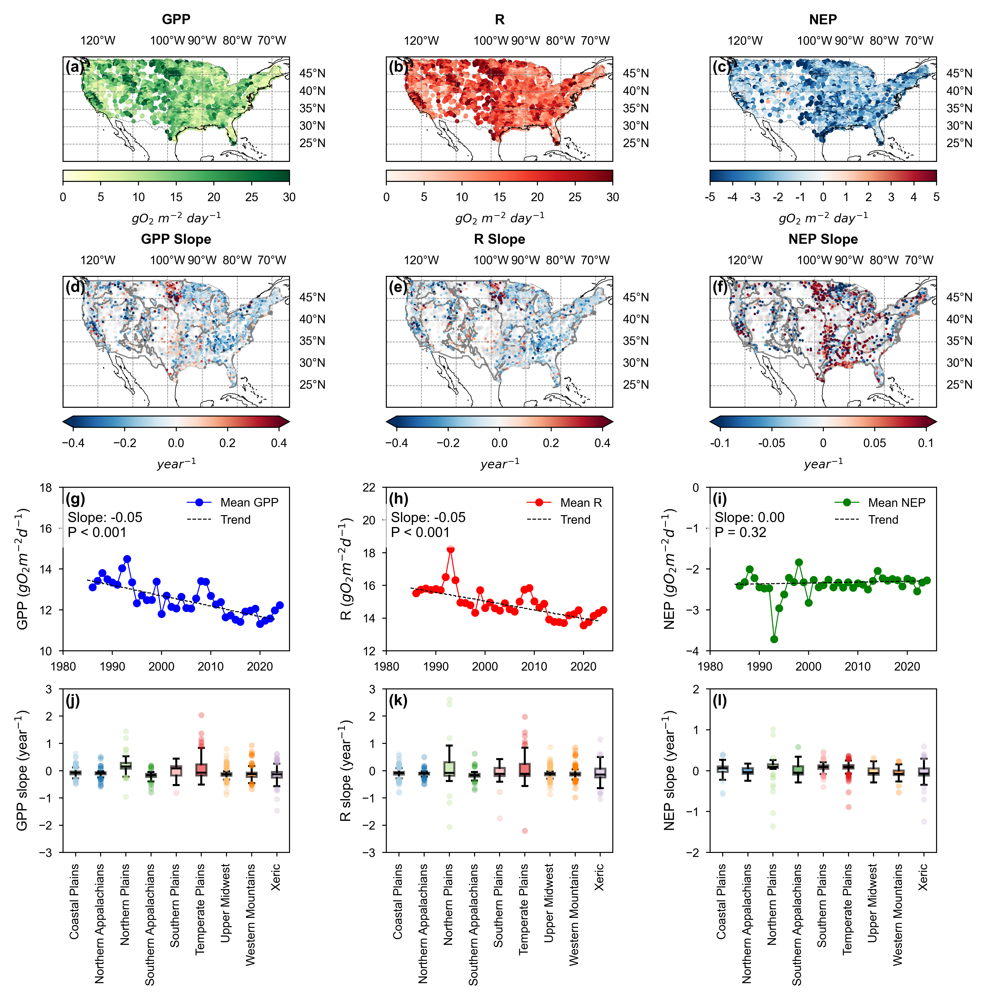

In [ ]:
# -*- coding: utf-8 -*-
from matplotlib.cm import ScalarMappable  
from matplotlib.colors import ListedColormap, BoundaryNorm,TwoSlopeNorm
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
import matplotlib.colors as mcolors
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 7,
    'axes.labelsize': 7,
    'axes.titlesize': 7,
    'xtick.labelsize': 6,
    'ytick.labelsize': 6,
    'legend.fontsize': 6,
    'figure.titlesize': 8,
    'lines.linewidth': 0.5,
    'axes.linewidth': 0.5,
    'xtick.major.width': 0.5,
    'ytick.major.width': 0.5,
    'xtick.major.size': 2,
    'ytick.major.size': 2
})

def plot_slope_box_by_ecoregion(ax, df, slope_col, groups, ecoregion_colors, y_label, panel_label):
    positions = np.arange(1, len(groups) + 1)
    
    # 为每个生态区准备数据和颜色
    data = [df.loc[df['WSA9_NAME'] == g, slope_col].dropna() for g in groups]
    box_colors = [ecoregion_colors.get(g, '#777777') for g in groups]  # 默认灰色
    
    # 逐组绘制箱线图，颜色分别设置
    for pos, d, color in zip(positions, data, box_colors):
        box = ax.boxplot(
            d, positions=[pos], widths=0.4,
            patch_artist=True,
            boxprops=dict(facecolor=color, alpha=0.6),
            medianprops=dict(color='black', linewidth=1.0),
            showcaps=True, showfliers=True,
            flierprops=dict(marker='o', markersize=3, linestyle='none',
                            markerfacecolor=color, markeredgecolor='none', alpha=0.3)
        )
    
    ax.set_ylabel(y_label)
    ax.set_xticks(positions)
    ax.set_xticklabels(groups, rotation=90, ha='center')

    # ax.text(0.02, 0.95, panel_label, transform=ax.transAxes,
    #         fontsize=10, fontweight='bold', va='top', ha='left')
    
    ax.grid(False)




fig = plt.figure(figsize=(6.8, 7), dpi=600,constrained_layout=True)
axdict = fig.subplot_mosaic(
    """
    ABC
    DEF
    GHI
    JKL
    """,
    per_subplot_kw={
        'A': {'projection': ccrs.PlateCarree()},
        'B': {'projection': ccrs.PlateCarree()},
        'C': {'projection': ccrs.PlateCarree()},
        'D': {'projection': ccrs.PlateCarree()},
        'E': {'projection': ccrs.PlateCarree()},
        'F': {'projection': ccrs.PlateCarree()}
        # G–L 不指定 projection，默认使用普通 2D axes
    },
)

titles = {
    'A': 'GPP',
    'B': 'R',
    'C': 'NEP',
    'D': 'GPP Slope',
    'E': 'R Slope',
    'F': 'NEP Slope'
}

for key, ax in axdict.items():
    ax.set_title(titles.get(key, ''), fontweight='bold', fontsize=7)

# 设定颜色（NC风格）可自定义或用 colormap
ecoregion_colors = {
    'Coastal Plains': '#A6CEE3',
    'Northern Appalachians': '#1F78B4',
    'Northern Plains': '#B2DF8A',
    'Southern Appalachians': '#33A02C',
    'Southern Plains': '#FB9A99',
    'Temperate Plains': '#E31A1C',
    'Upper Midwest': '#FDBF6F',
    'Western Mountains': '#FF7F00',
    'Xeric': '#CAB2D6'
}
eco['color'] = eco['WSA9_NAME'].map(ecoregion_colors).fillna("#cccccc")
for i, ax in enumerate(axdict.values()):
    if i < 6: 
        ax.set_extent([-130, -65, 20, 50], crs=ccrs.PlateCarree())
        ax.coastlines(linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.3)
        gridlines = ax.gridlines(draw_labels=True, color='gray', linestyle='--', linewidth=0.3)
        gridlines.bottom_labels = False
        gridlines.left_labels = False
        gridlines.xlabel_style = {'size': 6}
        gridlines.ylabel_style = {'size': 6}

        if i >2: 
            eco.boundary.plot(
                ax=ax,
                edgecolor='gray',
                linewidth=0.6,
                transform=ccrs.PlateCarree(),
                zorder=2
            )
    


trend_color_map = {'decreasing': 'blue', 'increasing': 'red', 'no trend': 'green'}

# --- 子图 A ---
sc = axdict['A'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['GPP_mean'],
    cmap=plt.cm.YlGn, norm=Normalize(vmin=0, vmax=30),
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['A'], orientation='horizontal', pad=0.05)
cbar.set_label('$gO_{2}~m^{-2}~day^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- 子图 B ---
sc = axdict['B'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['R_mean'],
    cmap=plt.cm.Reds, norm=Normalize(vmin=0, vmax=30),
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['B'], orientation='horizontal', pad=0.05)
cbar.set_label('$gO_{2}~m^{-2}~day^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- 子图 C ---
sc = axdict['C'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['NEP_mean'],
    cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-5, vmax=5),
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['C'], orientation='horizontal', pad=0.05)
cbar.set_label('$gO_{2}~m^{-2}~day^{-1}$', fontsize=6)

cbar.set_ticks([-5,-4, -3,-2,-1,0,1,2,3,4, 5]) 
cbar.set_ticklabels(['-5','-4','-3','-2','-1', '0','1','2','3','4', '5'])
cbar.ax.tick_params(labelsize=6)


# --- 子图 D ---
ax = axdict['D']
non_sig = final_merged_MLDT[final_merged_MLDT['GPP_p'] >= 0.05]
sig = final_merged_MLDT[final_merged_MLDT['GPP_p'] < 0.05]
# 底层灰色非显著点
ax.scatter(
    non_sig['Pour_long'], non_sig['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)
# 顶层显著点
sc = ax.scatter(
    sig['Pour_long'], sig['Pour_lat'],
    c=sig['GPP_slope'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-0.4, vmax=0.4),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree(), zorder=2
)
cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05,extend='both')
cbar.set_label('$year^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)
# ax.text(0.02, 0.85, f"Slope: {slope_gpp:.2f}\n{p_str_gpp}", transform=ax.transAxes,
#         va='top', ha='left', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
# axdict['D'].text(0.27, 0.15, f'N =: {len(sig)}', transform=axdict['G'].transAxes, fontsize=7, ha='right', va='top', color='black')
# axdict['D'].text(0.27, 0.05, f'N (P>0.05): {len(non_sig)}', transform=axdict['G'].transAxes, fontsize=7, ha='right', va='top', color='black')

# --- 子图 E ---
ax = axdict['E']
non_sig = final_merged_MLDT[final_merged_MLDT['R_p'] >= 0.05]
sig = final_merged_MLDT[final_merged_MLDT['R_p'] < 0.05]
ax.scatter(
    non_sig['Pour_long'], non_sig['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)
sc = ax.scatter(
    sig['Pour_long'], sig['Pour_lat'],
    c=sig['R_slope'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-0.4, vmax=0.4),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree(), zorder=2
)
cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05,extend='both')
cbar.set_label('$year^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)
# axdict['E'].text(0.27, 0.15, f'N (P<0.05): {len(sig)}', transform=axdict['H'].transAxes, fontsize=7, ha='right', va='top', color='black')
# axdict['E'].text(0.27, 0.05, f'N (P>0.05): {len(non_sig)}', transform=axdict['H'].transAxes, fontsize=7, ha='right', va='top', color='black')

# --- 子图 F ---
ax = axdict['F']
non_sig = final_merged_MLDT[final_merged_MLDT['NEP_p'] >= 0.05]
sig = final_merged_MLDT[final_merged_MLDT['NEP_p'] < 0.05]
ax.scatter(
    non_sig['Pour_long'], non_sig['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)
sc = ax.scatter(
    sig['Pour_long'], sig['Pour_lat'],
    c=sig['NEP_slope'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-.1, vmax=.1),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree(), zorder=2
)
cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05,extend='both')
cbar.set_ticks([-.1,-.05,0,.05, .1]) 
cbar.set_ticklabels(['-0.1','-0.05', '0','0.05','0.1'])
cbar.set_label('$year^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)
# axdict['F'].text(0.27, 0.15, f'N (P<0.05): {len(sig)}', transform=axdict['I'].transAxes, fontsize=7, ha='right', va='top', color='black')
# axdict['F'].text(0.27, 0.05, f'N (P>0.05): {len(non_sig)}', transform=axdict['I'].transAxes, fontsize=7, ha='right', va='top', color='black')


regions = list(mean_all.keys())

x_dates_gpp = GPP_yearly_mean_one.index[1:]
y_gpp = GPP_yearly_mean_one.values[1:]
x_years_gpp = np.array([d.year for d in x_dates_gpp])
xticks_major = np.arange(x_years_gpp.min() // 10 * 10, x_years_gpp.max() + 1, 10)
xticks_major_dt = pd.to_datetime(xticks_major.astype(int), format='%Y')
grid_years = np.linspace(x_years_gpp.min(), x_years_gpp.max(), 100)
grid_years_dt = pd.to_datetime(grid_years.astype(int), format='%Y')
trend_gpp, lower_gpp, upper_gpp, slope_gpp, p_gpp = mann_kendall_ci(x_years_gpp, y_gpp, grid_years)
p_str_gpp = format_p_value(p_gpp)
# 图 G：GPP
ax = axdict["G"]
ax.plot(x_dates_gpp, y_gpp, marker="o", linestyle="-", color="b", label="Mean GPP", markersize=3)
ax.plot(grid_years_dt, trend_gpp, linestyle="--", color="k", label="Trend")
# ax.fill_between(grid_years_dt, lower_gpp, upper_gpp, color="k", alpha=0.2)
ax.text(0.02, 0.85, f"Slope: {slope_gpp:.2f}\n{p_str_gpp}", transform=ax.transAxes,
        va='top', ha='left', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
ax.set_ylabel("GPP ($gO_2 m^{-2} d^{-1}$)")
ax.set_xticks(xticks_major_dt)
ax.set_xticklabels([str(year) for year in xticks_major])
ax.set_ylim(10, 18)
ax.legend(loc='upper right', frameon=False)

# 图 H：R
ax = axdict["H"]
x_dates_r = R_yearly_mean_one.index[1:]
y_r = R_yearly_mean_one.values[1:]
x_years_r = np.array([d.year for d in x_dates_r])
grid_years_r = np.linspace(x_years_r.min(), x_years_r.max(), 100)
grid_years_r_dt = pd.to_datetime(grid_years_r.astype(int), format='%Y')
trend_r, lower_r, upper_r, slope_r, p_r = mann_kendall_ci(x_years_r, y_r, grid_years_r)
p_str_r = format_p_value(p_r)
ax.plot(x_dates_r, y_r, marker="o", linestyle="-", color="r", label="Mean R", markersize=3)
ax.plot(grid_years_r_dt, trend_r, linestyle="--", color="k", label="Trend")
# ax.fill_between(grid_years_r_dt, lower_r, upper_r, color="k", alpha=0.2)
ax.text(0.02, 0.85, f"Slope: {slope_r:.2f}\n{p_str_r}", transform=ax.transAxes,
        va='top', ha='left', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
ax.set_ylabel("R ($gO_2 m^{-2} d^{-1}$)")
ax.set_xticks(xticks_major_dt)
ax.set_xticklabels([str(year) for year in xticks_major])
ax.set_ylim(12, 22)
ax.legend(loc='upper right', frameon=False)


# 图 I：NEP
ax = axdict["I"]
x_dates_nep = NEP_yearly_mean_one.index[1:]
y_nep = NEP_yearly_mean_one.values[1:]
x_years_nep = np.array([d.year for d in x_dates_nep])
grid_years_nep = np.linspace(x_years_nep.min(), x_years_nep.max(), 100)
grid_years_nep_dt = pd.to_datetime(grid_years_nep.astype(int), format='%Y')
trend_nep, lower_nep, upper_nep, slope_nep, p_nep = mann_kendall_ci(x_years_nep, y_nep, grid_years_nep)
p_str_nep = format_p_value(p_nep)
ax.plot(x_dates_nep, y_nep, marker="o", linestyle="-", color="g", label="Mean NEP", markersize=3)
ax.plot(grid_years_nep_dt, trend_nep, linestyle="--", color="k", label="Trend")
# ax.fill_between(grid_years_nep_dt, lower_nep, upper_nep, color="k", alpha=0.2)
ax.text(0.02, 0.85, f"Slope: {slope_nep:.2f}\n{p_str_nep}", transform=ax.transAxes,
        va='top', ha='left', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
ax.set_ylabel("NEP ($gO_2 m^{-2} d^{-1}$)")
ax.set_xticks(xticks_major_dt)
ax.set_xticklabels([str(year) for year in xticks_major])
ax.set_ylim(-4, 0)
ax.legend(loc='upper right', frameon=False)



# J 子图：GPP
plot_slope_box_by_ecoregion(
     axdict["J"],  sig_gpp, 'GPP_slope', groups, ecoregion_colors,
                            'GPP slope (year$^{-1}$)', 'j')
axdict["J"].set_ylim(-3, 3)
# K 子图：R
plot_slope_box_by_ecoregion(
    axdict["K"],  sig_r, 'R_slope', groups, ecoregion_colors,
                            'R slope (year$^{-1}$)', 'k')
axdict["K"].set_ylim(-3, 3)
# L 子图：NEP
plot_slope_box_by_ecoregion(
    axdict["L"], sig_nep, 'NEP_slope', groups, ecoregion_colors,
                            'NEP slope (year$^{-1}$)', 'l')
axdict["L"].set_ylim(-2, 2)

# 子图标签
panel_labels = {
    'A': '(a)', 'B': '(b)', 'C': '(c)',
    'D': '(d)', 'E': '(e)', 'F': '(f)',
    'G': '(g)', 'H': '(h)', 'I': '(i)',
    'J': '(j)', 'K': '(k)', 'L': '(l)'
}
for key, ax in axdict.items():
    ax.text(0.01, 0.97, panel_labels[key],
            transform=ax.transAxes,
            fontsize=8, fontweight='bold',
            va='top', ha='left')

# plt.tight_layout()
plt.savefig('FIG3_NC_f.pdf', dpi=600, bbox_inches='tight', transparent=True)
plt.savefig('FIG3_NC_f.jpg', dpi=600, bbox_inches='tight', transparent=True)
plt.show()


# FIG4

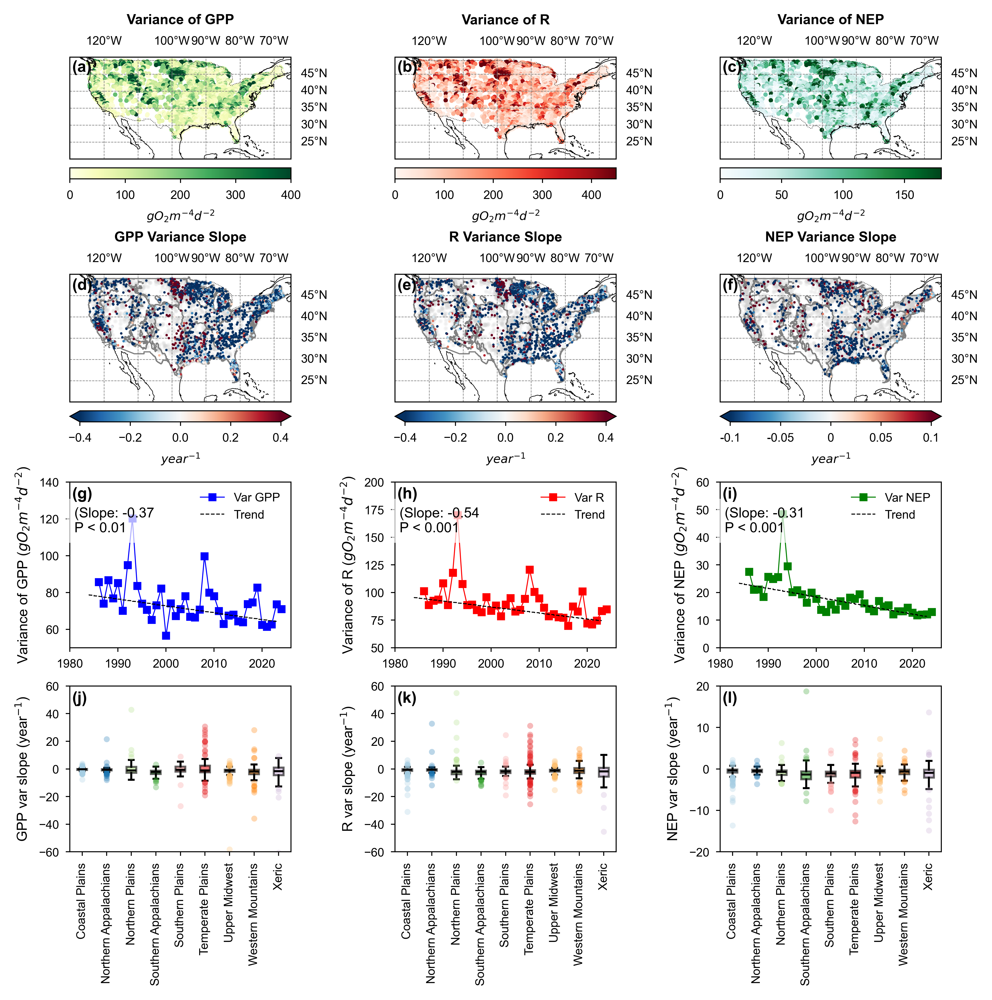

In [ ]:
# -*- coding: utf-8 -*-
from matplotlib.cm import ScalarMappable  
from matplotlib.colors import ListedColormap, BoundaryNorm,TwoSlopeNorm
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
import matplotlib.colors as mcolors
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 7,
    'axes.labelsize': 7,
    'axes.titlesize': 7,
    'xtick.labelsize': 6,
    'ytick.labelsize': 6,
    'legend.fontsize': 6,
    'figure.titlesize': 8,
    'lines.linewidth': 0.5,
    'axes.linewidth': 0.5,
    'xtick.major.width': 0.5,
    'ytick.major.width': 0.5,
    'xtick.major.size': 2,
    'ytick.major.size': 2
})
# # 定义 Normalize
def quantile_norm(data, col):
    return Normalize(
        vmin=0,
        vmax=data[col].quantile(0.95)
    )


norm_gpp =Normalize(vmin=0,vmax=400)
norm_r =Normalize(vmin=0,vmax=450)
norm_nep = Normalize(vmin=0,vmax=180)
def plot_slope_box_by_ecoregion(ax, df, slope_col, groups, ecoregion_colors, y_label, panel_label):
    positions = np.arange(1, len(groups) + 1)
    
    # 为每个生态区准备数据和颜色
    data = [df.loc[df['WSA9_NAME'] == g, slope_col].dropna() for g in groups]
    box_colors = [ecoregion_colors.get(g, '#777777') for g in groups]  # 默认灰色
    
    # 逐组绘制箱线图，颜色分别设置
    for pos, d, color in zip(positions, data, box_colors):
        box = ax.boxplot(
            d, positions=[pos], widths=0.4,
            patch_artist=True,
            boxprops=dict(facecolor=color, alpha=0.6),
            medianprops=dict(color='black', linewidth=1.0),
            showcaps=True, showfliers=True,
            flierprops=dict(marker='o', markersize=3, linestyle='none',
                            markerfacecolor=color, markeredgecolor='none', alpha=0.3)
        )
    
    ax.set_ylabel(y_label)
    ax.set_xticks(positions)
    ax.set_xticklabels(groups, rotation=90, ha='center')

    # ax.text(0.02, 0.95, panel_label, transform=ax.transAxes,
    #         fontsize=10, fontweight='bold', va='top', ha='left')
    
    ax.grid(False)




fig = plt.figure(figsize=(6.8, 7), dpi=600,constrained_layout=True)
axdict = fig.subplot_mosaic(
    """
    ABC
    DEF
    GHI
    JKL
    """,
    per_subplot_kw={
        'A': {'projection': ccrs.PlateCarree()},
        'B': {'projection': ccrs.PlateCarree()},
        'C': {'projection': ccrs.PlateCarree()},
        'D': {'projection': ccrs.PlateCarree()},
        'E': {'projection': ccrs.PlateCarree()},
        'F': {'projection': ccrs.PlateCarree()}
        # G–L 不指定 projection，默认使用普通 2D axes
    },
)

titles = {
    'A': 'Variance of GPP',
    'B': 'Variance of R',
    'C': 'Variance of NEP',

    'D': 'GPP Variance Slope',
    'E': 'R Variance Slope',
    'F': 'NEP Variance Slope'
}

for key, ax in axdict.items():
    ax.set_title(titles.get(key, ''), fontweight='bold', fontsize=7)

# 设定颜色（NC风格）可自定义或用 colormap
ecoregion_colors = {
    'Coastal Plains': '#A6CEE3',
    'Northern Appalachians': '#1F78B4',
    'Northern Plains': '#B2DF8A',
    'Southern Appalachians': '#33A02C',
    'Southern Plains': '#FB9A99',
    'Temperate Plains': '#E31A1C',
    'Upper Midwest': '#FDBF6F',
    'Western Mountains': '#FF7F00',
    'Xeric': '#CAB2D6'
}
eco['color'] = eco['WSA9_NAME'].map(ecoregion_colors).fillna("#cccccc")
for i, ax in enumerate(axdict.values()):
    if i < 6: 
        ax.set_extent([-130, -65, 20, 50], crs=ccrs.PlateCarree())
        ax.coastlines(linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.3)
        gridlines = ax.gridlines(draw_labels=True, color='gray', linestyle='--', linewidth=0.3)
        gridlines.bottom_labels = False
        gridlines.left_labels = False
        gridlines.xlabel_style = {'size': 6}
        gridlines.ylabel_style = {'size': 6}

        if i >2: 
            eco.boundary.plot(
                ax=ax,
                edgecolor='gray',
                linewidth=0.6,
                transform=ccrs.PlateCarree(),
                zorder=2
            )
    
    # 绘制所有边界（一次性）
    # eco.boundary.plot(ax=ax, edgecolor=eco['color'], linewidth=0.6, transform=ccrs.PlateCarree(), zorder=2)


trend_color_map = {'decreasing': 'blue', 'increasing': 'red', 'no trend': 'green'}

# --- A: GPP 方差平均值 ---
sc = axdict['A'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['GPP_var_me'],
    cmap=plt.cm.YlGn, norm=norm_gpp,
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['A'], orientation='horizontal', pad=0.05)
cbar.set_label('$gO_2 m^{-4} d^{-2}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- B: R 方差平均值 ---
sc = axdict['B'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['R_var_mean'],
    cmap=plt.cm.Reds, norm=norm_r,
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['B'], orientation='horizontal', pad=0.05)
cbar.set_label('$gO_2 m^{-4} d^{-2}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- C: NEP 方差平均值 ---
sc = axdict['C'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['NEP_var_me'],
    cmap=plt.cm.BuGn, norm=norm_nep,
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['C'], orientation='horizontal', pad=0.05)
cbar.set_label('$gO_2 m^{-4} d^{-2}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)


sig_gpp = final_merged_MLDT[final_merged_MLDT['GPP_var_p'] < 0.05]
non_sig_gpp = final_merged_MLDT[final_merged_MLDT['GPP_var_p'] > 0.05]


# --- 子图 D ---
ax = axdict['D']
non_sig = final_merged_MLDT[final_merged_MLDT['GPP_p'] >= 0.05]
sig = final_merged_MLDT[final_merged_MLDT['GPP_p'] < 0.05]
# 底层灰色非显著点
ax.scatter(
    non_sig['Pour_long'], non_sig['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)
# 顶层显著点
sc = ax.scatter(
    sig['Pour_long'], sig['Pour_lat'],
    c=sig['GPP_var_sl'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-0.4, vmax=0.4),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree(), zorder=2
)
cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05,extend='both')
cbar.set_label('$year^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)
# axdict['D'].text(0.27, 0.15, f'N (P<0.05): {len(sig)}', transform=axdict['G'].transAxes, fontsize=7, ha='right', va='top', color='black')
# axdict['D'].text(0.27, 0.05, f'N (P>0.05): {len(non_sig)}', transform=axdict['G'].transAxes, fontsize=7, ha='right', va='top', color='black')

# --- 子图 E ---
ax = axdict['E']
non_sig = final_merged_MLDT[final_merged_MLDT['R_p'] >= 0.05]
sig = final_merged_MLDT[final_merged_MLDT['R_p'] < 0.05]
ax.scatter(
    non_sig['Pour_long'], non_sig['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)
sc = ax.scatter(
    sig['Pour_long'], sig['Pour_lat'],
    c=sig['R_var_slop'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-0.4, vmax=0.4),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree(), zorder=2
)
cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05,extend='both')
cbar.set_label('$year^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)
# axdict['E'].text(0.27, 0.15, f'N (P<0.05): {len(sig)}', transform=axdict['H'].transAxes, fontsize=7, ha='right', va='top', color='black')
# axdict['E'].text(0.27, 0.05, f'N (P>0.05): {len(non_sig)}', transform=axdict['H'].transAxes, fontsize=7, ha='right', va='top', color='black')

# --- 子图 F ---
ax = axdict['F']
non_sig = final_merged_MLDT[final_merged_MLDT['NEP_p'] >= 0.05]
sig = final_merged_MLDT[final_merged_MLDT['NEP_p'] < 0.05]
ax.scatter(
    non_sig['Pour_long'], non_sig['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)
sc = ax.scatter(
    sig['Pour_long'], sig['Pour_lat'],
    c=sig['NEP_var_sl'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-.1, vmax=.1),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree(), zorder=2
)
cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05,extend='both')
cbar.set_ticks([-.1,-.05,0,.05, .1]) 
cbar.set_ticklabels(['-0.1','-0.05', '0','0.05','0.1'])
cbar.set_label('$year^{-1}$', fontsize=6)
cbar.ax.tick_params(labelsize=6)
# axdict['F'].text(0.27, 0.15, f'N (P<0.05): {len(sig)}', transform=axdict['I'].transAxes, fontsize=7, ha='right', va='top', color='black')
# axdict['F'].text(0.27, 0.05, f'N (P>0.05): {len(non_sig)}', transform=axdict['I'].transAxes, fontsize=7, ha='right', va='top', color='black')



# 图 D/E/F 处理 GPP/R/NEP 方差，调用同样的函数替换
def plot_var(ax, x_dates, y, label, color,  ylabel):
    x_years = np.array([d.year for d in x_dates])
    trend, lower, upper, slope, p = mann_kendall_ci(x_years, y, grid_years_var)
    ax.plot(x_dates, y, marker="s", linestyle="-", color=color, label=label,markersize=3)
    ax.plot(grid_years_var_dt, trend, linestyle="--", color="k", label="Trend")
    # ax.fill_between(grid_years_var_dt, lower, upper, color="k", alpha=0.2)
    p_str = format_p_value(p)
    ax.text(0.02, 0.85, f"(Slope: {slope:.2f}\n{p_str}", transform=ax.transAxes,
            va='top', ha='left', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
    ax.set_ylabel(ylabel)
    ax.legend(loc='upper right', frameon=False)
    ax.set_xticks(xticks_major_dt)
    ax.set_xticklabels([str(year) for year in xticks_major])
    return ax

grid_years_var = np.linspace(1984, 2023, 100)
grid_years_var_dt = pd.to_datetime(grid_years_var.astype(int), format='%Y')

ax_D = plot_var(axdict["G"],  GPP_yearly_var_one.index[1:], GPP_yearly_var_one.values[1:], "Var GPP", "b",  "Variance of GPP ($gO_2 m^{-4} d^{-2}$)")
ax_E = plot_var(axdict["H"],  R_yearly_var_one.index[1:], R_yearly_var_one.values[1:], "Var R", "r", "Variance of R ($gO_2 m^{-4} d^{-2}$)")
ax_F = plot_var(axdict["I"],  NEP_yearly_var_one.index[1:], NEP_yearly_var_one.values[1:], "Var NEP", "g", "Variance of NEP ($gO_2 m^{-4} d^{-2}$)")
axdict["G"].set_ylim(50,140)
axdict["H"].set_ylim(50,200)
axdict["I"].set_ylim(0,60)

# 筛选数据（显著性）
sig_var_gpp = lakes_with_ecoregion[(lakes_with_ecoregion['GPP_var_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]
sig_var_r = lakes_with_ecoregion[(lakes_with_ecoregion['R_var_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]
sig_var_nep = lakes_with_ecoregion[(lakes_with_ecoregion['NEP_var_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]

# 分组保持一致
groups = sorted(sig_var_gpp['WSA9_NAME'].unique())[:10]

# 提取函数
def extract_data(df, col, groups):
    return [df.loc[df['WSA9_NAME'] == g, col].dropna() for g in groups]

# 提取每类数据
gpp_var_mean = extract_data(sig_var_gpp,  'GPP_var_me', groups)
gpp_var_slope = extract_data(sig_var_gpp, 'GPP_var_sl', groups)

r_var_mean = extract_data(sig_var_r,  'R_var_mean', groups)
r_var_slope = extract_data(sig_var_r, 'R_var_slop', groups)

nep_var_mean = extract_data(sig_var_nep,  'NEP_var_me', groups)
nep_var_slope = extract_data(sig_var_nep, 'NEP_var_sl', groups)

# # J 子图：GPP
plot_slope_box_by_ecoregion(
     axdict["J"],  sig_var_gpp , 'GPP_var_sl', groups, ecoregion_colors,
                            'GPP var slope (year$^{-1}$)', 'j')
axdict["J"].set_ylim(-60, 60)
# # K 子图：R
plot_slope_box_by_ecoregion(
    axdict["K"],  sig_var_r , 'R_var_slop', groups, ecoregion_colors,
                            'R var slope (year$^{-1}$)', 'k')
axdict["K"].set_ylim(-60, 60)
# # L 子图：NEP
plot_slope_box_by_ecoregion(
    axdict["L"], sig_var_nep , 'NEP_var_sl', groups, ecoregion_colors,
                            'NEP var slope (year$^{-1}$)', 'l')
axdict["L"].set_ylim(-20, 20)

# 子图标签
panel_labels = {
    'A': '(a)', 'B': '(b)', 'C': '(c)',
    'D': '(d)', 'E': '(e)', 'F': '(f)',
    'G': '(g)', 'H': '(h)', 'I': '(i)',
    'J': '(j)', 'K': '(k)', 'L': '(l)'
}
for key, ax in axdict.items():
    ax.text(0.01, 0.97, panel_labels[key],
            transform=ax.transAxes,
            fontsize=8, fontweight='bold',
            va='top', ha='left')

# plt.tight_layout()
plt.savefig('FIG4_NC_f.pdf', dpi=600, bbox_inches='tight', transparent=True)
plt.savefig('FIG4_NC_f.jpg', dpi=600, bbox_inches='tight', transparent=True)
plt.show()


# FIG5

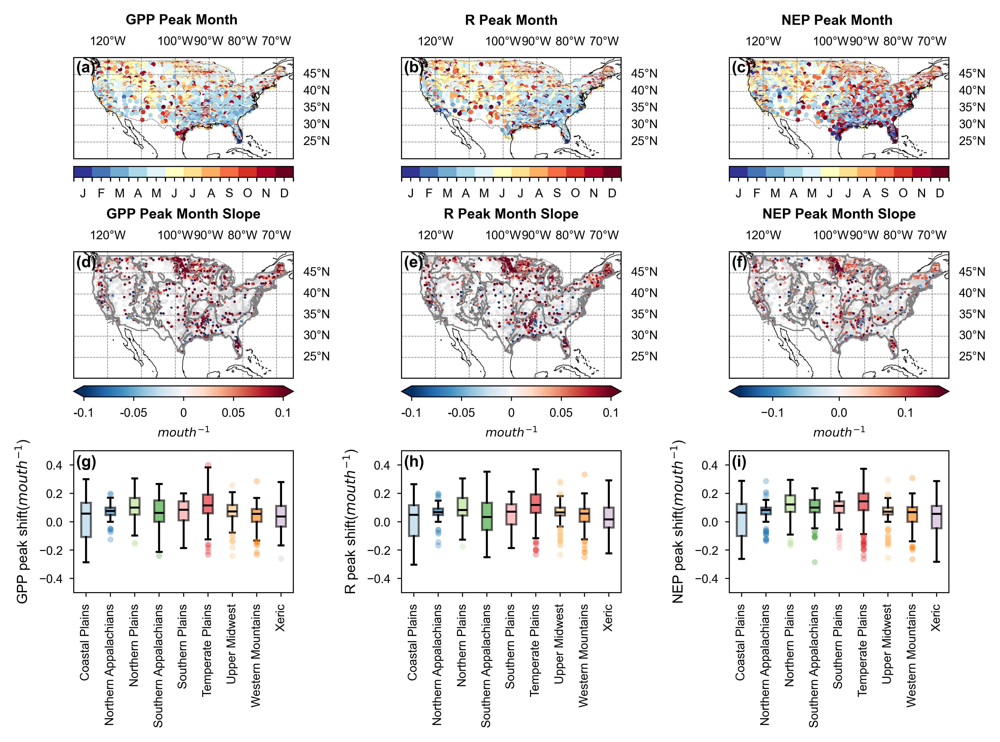

In [ ]:
# -*- coding: utf-8 -*-
from matplotlib.cm import ScalarMappable  
from matplotlib.colors import ListedColormap, BoundaryNorm,TwoSlopeNorm
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
import matplotlib.colors as mcolors
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 7,
    'axes.labelsize': 7,
    'axes.titlesize': 7,
    'xtick.labelsize': 6,
    'ytick.labelsize': 6,
    'legend.fontsize': 6,
    'figure.titlesize': 8,
    'lines.linewidth': 0.5,
    'axes.linewidth': 0.5,
    'xtick.major.width': 0.5,
    'ytick.major.width': 0.5,
    'xtick.major.size': 2,
    'ytick.major.size': 2
})
# # 定义 Normalize
def quantile_norm(data, col):
    return Normalize(
        vmin=0,
        vmax=data[col].quantile(0.95)
    )



norm_gpp =Normalize(vmin=0,vmax=400)
norm_r =Normalize(vmin=0,vmax=450)
norm_nep = Normalize(vmin=0,vmax=180)
def plot_slope_box_by_ecoregion(ax, df, slope_col, groups, ecoregion_colors, y_label, panel_label):
    positions = np.arange(1, len(groups) + 1)
    
    # 为每个生态区准备数据和颜色
    data = [df.loc[df['WSA9_NAME'] == g, slope_col].dropna() for g in groups]
    box_colors = [ecoregion_colors.get(g, '#777777') for g in groups]  # 默认灰色
    
    # 逐组绘制箱线图，颜色分别设置
    for pos, d, color in zip(positions, data, box_colors):
        box = ax.boxplot(
            d, positions=[pos], widths=0.4,
            patch_artist=True,
            boxprops=dict(facecolor=color, alpha=0.6),
            medianprops=dict(color='black', linewidth=1.0),
            showcaps=True, showfliers=True,
            flierprops=dict(marker='o', markersize=3, linestyle='none',
                            markerfacecolor=color, markeredgecolor='none', alpha=0.3)
        )
    
    ax.set_ylabel(y_label)
    ax.set_xticks(positions)
    ax.set_xticklabels(groups, rotation=90, ha='center')

    # ax.text(0.02, 0.95, panel_label, transform=ax.transAxes,
    #         fontsize=10, fontweight='bold', va='top', ha='left')
    
    ax.grid(False)




fig = plt.figure(figsize=(6.8, 5), dpi=600,constrained_layout=True)
axdict = fig.subplot_mosaic(
    """
    ABC
    DEF
    GHI

    """,
    per_subplot_kw={
        'A': {'projection': ccrs.PlateCarree()},
        'B': {'projection': ccrs.PlateCarree()},
        'C': {'projection': ccrs.PlateCarree()},
        'D': {'projection': ccrs.PlateCarree()},
        'E': {'projection': ccrs.PlateCarree()},
        'F': {'projection': ccrs.PlateCarree()}
        # G–L 不指定 projection，默认使用普通 2D axes
    },
)

titles = {
    'A': 'GPP Peak Month ',
    'B': 'R Peak Month',
    'C': 'NEP Peak Month ',
    'D': 'GPP Peak Month Slope',
    'E': 'R Peak Month Slope',
    'F': 'NEP Peak Month Slope'
}

for key, ax in axdict.items():
    ax.set_title(titles.get(key, ''), fontweight='bold', fontsize=7)

# 设定颜色（NC风格）可自定义或用 colormap
ecoregion_colors = {
    'Coastal Plains': '#A6CEE3',
    'Northern Appalachians': '#1F78B4',
    'Northern Plains': '#B2DF8A',
    'Southern Appalachians': '#33A02C',
    'Southern Plains': '#FB9A99',
    'Temperate Plains': '#E31A1C',
    'Upper Midwest': '#FDBF6F',
    'Western Mountains': '#FF7F00',
    'Xeric': '#CAB2D6'
}
eco['color'] = eco['WSA9_NAME'].map(ecoregion_colors).fillna("#cccccc")
for i, ax in enumerate(axdict.values()):
    if i < 6: 
        ax.set_extent([-130, -65, 20, 50], crs=ccrs.PlateCarree())
        ax.coastlines(linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.3)
        gridlines = ax.gridlines(draw_labels=True, color='gray', linestyle='--', linewidth=0.3)
        gridlines.bottom_labels = False
        gridlines.left_labels = False
        gridlines.xlabel_style = {'size': 6}
        gridlines.ylabel_style = {'size': 6}

        if i >2: 
            eco.boundary.plot(
                ax=ax,
                edgecolor='gray',
                linewidth=0.6,
                transform=ccrs.PlateCarree(),
                zorder=2
            )
    
    # 绘制所有边界（一次性）
    # eco.boundary.plot(ax=ax, edgecolor=eco['color'], linewidth=0.6, transform=ccrs.PlateCarree(), zorder=2)


import matplotlib.colors as mcolors
import numpy as np
# import cartopy.crs as ccrs

# 自定义 12 色月份 colormap（冷到暖渐变）
month_colors = [
    '#313695', '#4575b4', '#74add1', '#abd9e9',  # Jan–Apr
    '#e0f3f8', '#ffffbf', '#fee090', '#fdae61',  # May–Aug
    '#f46d43', '#d73027', '#a50026', '#67001f'   # Sep–Dec
]
cmap_month = mcolors.ListedColormap(month_colors)

# 设置边界并创建离散 colormap 的 norm（对应月份 1–12）
bounds = np.arange(0.5, 13, 1)  # 生成 [0.5, 1.5, ..., 12.5]
norm_month = mcolors.BoundaryNorm(bounds, cmap_month.N)

# 英文月份缩写
month_labels = ['J', 'F', 'M', 'A', 'M', 'J',
                'J', 'A', 'S', 'O', 'N', 'D']

# --- A: GPP 方差平均值 ---
sc = axdict['A'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['GPP_freq'],
    cmap=cmap_month, norm=norm_month,
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['A'], orientation='horizontal', pad=0.05,
                    ticks=[i + 0.5 for i in range(12)])
cbar.set_ticks(np.arange(1, 13)) 
cbar.ax.set_xticklabels(month_labels)
# cbar.set_label('Month', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- B: R 频率 ---
sc = axdict['B'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['R_freq'],
    cmap=cmap_month, norm=norm_month,
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['B'], orientation='horizontal', pad=0.05,
                    ticks=[i + 0.5 for i in range(12)])
cbar.set_ticks(np.arange(1, 13)) 
cbar.ax.set_xticklabels(month_labels)
# cbar.set_label('Month', fontsize=6)
cbar.ax.tick_params(labelsize=6)

# --- C: NEP 频率 ---
sc = axdict['C'].scatter(
    final_merged_MLDT['Pour_long'], final_merged_MLDT['Pour_lat'],
    c=final_merged_MLDT['NEP_freq'],
    cmap=cmap_month, norm=norm_month,
    s=1.5, transform=ccrs.PlateCarree()
)
cbar = fig.colorbar(sc, ax=axdict['C'], orientation='horizontal', pad=0.05,
                    ticks= [i + 0.5 for i in range(12)])
cbar.set_ticks(np.arange(1, 13)) 
cbar.ax.set_xticklabels(month_labels)
# cbar.set_label('Month', fontsize=6)
cbar.ax.tick_params(labelsize=6)


# --- D: GPP 方差斜率（显著）---
sig_gpp = final_merged_MLDT[final_merged_MLDT['GPP_peak_p'] < 0.05]
non_sig_gpp = final_merged_MLDT[final_merged_MLDT['GPP_peak_p'] > 0.05]

# Plot non-significant points for GPP
axdict['D'].scatter(
    non_sig_gpp['Pour_long'], non_sig_gpp['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)

# Plot significant points for GPP
sc_gpp = axdict['D'].scatter(
    sig_gpp['Pour_long'], sig_gpp['Pour_lat'],
    c=sig_gpp['GPP_peak_s'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-.1,vmax=.1),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree()
)

# Colorbar for GPP
cbar_gpp = fig.colorbar(sc_gpp, ax=axdict['D'], orientation='horizontal', pad=0.05, extend='both')
cbar_gpp.set_ticks([-.1,-.05,0,.05, .1]) 
cbar_gpp.set_ticklabels(['-0.1','-0.05', '0','0.05','0.1'])
cbar_gpp.set_label('$mouth^{-1}$', fontsize=6)
cbar_gpp.ax.tick_params(labelsize=6)
# cbar_gpp.ax.xaxis.set_major_locator(MaxNLocator(nbins=5))

# Add counts for significant and non-significant
# axdict['G'].text(0.27, 0.15, f'N (P<0.05): {len(sig_gpp)}', transform=axdict['G'].transAxes, fontsize=7, ha='right', va='top', color='black')
# axdict['G'].text(0.27, 0.05, f'N (P>0.05): {len(non_sig_gpp)}', transform=axdict['G'].transAxes, fontsize=7, ha='right', va='top', color='black')

# --- H: R 方差斜率（显著）---
sig_r = final_merged_MLDT[final_merged_MLDT['R_peak_p'] < 0.05]
non_sig_r = final_merged_MLDT[final_merged_MLDT['R_peak_p'] > 0.05]

# Plot non-significant points for R
axdict['E'].scatter(
    non_sig_r['Pour_long'], non_sig_r['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)

# Plot significant points for R
sc_r = axdict['E'].scatter(
    sig_r['Pour_long'], sig_r['Pour_lat'],
    c=sig_r['R_peak_slo'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-.1,vmax=.1),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree()
)

# Colorbar for R
cbar_r = fig.colorbar(sc_r, ax=axdict['E'], orientation='horizontal', pad=0.05, extend='both')
cbar_r.set_ticks([-.1,-.05,0,.05, .1]) 
cbar_r.set_ticklabels(['-0.1','-0.05', '0','0.05','0.1'])
cbar_r.set_label('$mouth^{-1}$', fontsize=6)
cbar_r.ax.tick_params(labelsize=6)
# cbar_r.ax.xaxis.set_major_locator(MaxNLocator(nbins=5))

# # Add counts for significant and non-significant
# axdict['H'].text(0.27, 0.15, f'N (P<0.05): {len(sig_r)}', transform=axdict['H'].transAxes, fontsize=7, ha='right', va='top', color='black')
# axdict['H'].text(0.27, 0.05, f'N (P>0.05): {len(non_sig_r)}', transform=axdict['H'].transAxes, fontsize=7, ha='right', va='top', color='black')

# --- I: NEP （显著）---
sig_nep = final_merged_MLDT[final_merged_MLDT['NEP_peak_p'] < 0.05]
non_sig_nep = final_merged_MLDT[final_merged_MLDT['NEP_peak_p'] > 0.05]

# Plot non-significant points for NEP
axdict['F'].scatter(
    non_sig_nep['Pour_long'], non_sig_nep['Pour_lat'],
    color='lightgray', s=1.5, alpha=0.2,
    transform=ccrs.PlateCarree(), zorder=1
)

# Plot significant points for NEP
sc_nep = axdict['F'].scatter(
    sig_nep['Pour_long'], sig_nep['Pour_lat'],
    c=sig_nep['NEP_peak_s'], cmap=plt.cm.RdBu_r, norm=Normalize(vmin=-.15,vmax=.15),
    s=1.5, edgecolors='none', transform=ccrs.PlateCarree()
)

# Colorbar for NEP
cbar_nep = fig.colorbar(sc_nep, ax=axdict['F'], orientation='horizontal', pad=0.05, extend='both')
cbar_nep.set_label('$mouth^{-1}$', fontsize=6)
cbar_nep.ax.tick_params(labelsize=6)


# # 筛选数据（显著性）
sig_peak_gpp = lakes_with_ecoregion[(lakes_with_ecoregion['GPP_peak_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]
sig_peak_r = lakes_with_ecoregion[(lakes_with_ecoregion['R_peak_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]
sig_peak_nep = lakes_with_ecoregion[(lakes_with_ecoregion['NEP_peak_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]

# 共用前10个生态区
groups = sorted(sig_peak_gpp['WSA9_NAME'].unique())[:10]
positions = np.arange(1, len(groups) + 1)

# 提取函数
def extract_data(df, col, groups):
    return [df.loc[df['WSA9_NAME'] == g, col].dropna() for g in groups]

# 提取数据
gpp_freq = extract_data(sig_peak_gpp, 'GPP_freq', groups)
gpp_slope = extract_data(sig_peak_gpp, 'GPP_peak_s', groups)

r_freq = extract_data(sig_peak_r, 'R_freq', groups)
r_slope = extract_data(sig_peak_r, 'R_peak_slo', groups)

nep_freq = extract_data(sig_peak_nep, 'NEP_freq', groups)
nep_slope = extract_data(sig_peak_nep, 'NEP_peak_s', groups)

# # # J 子图：GPP
plot_slope_box_by_ecoregion(
     axdict["G"],  sig_peak_gpp , 'GPP_peak_s', groups, ecoregion_colors,
                            'GPP peak shift($mouth^{-1}$)', 'j')
axdict["G"].set_ylim(-.5,.5)
# # # K 子图：R
plot_slope_box_by_ecoregion(
    axdict["H"],  sig_peak_r , 'R_peak_slo', groups, ecoregion_colors,
                            'R peak shift($mouth^{-1}$)', 'k')
axdict["H"].set_ylim(-.5,.5)
# # # L 子图：NEP
plot_slope_box_by_ecoregion(
    axdict["I"], sig_peak_nep , 'NEP_peak_s', groups, ecoregion_colors,
                            'NEP peak shift($mouth^{-1}$)', 'l')
axdict["I"].set_ylim(-.5,.5)

# 子图标签
panel_labels = {
    'A': '(a)', 'B': '(b)', 'C': '(c)',
    'D': '(d)', 'E': '(e)', 'F': '(f)',
    'G': '(g)', 'H': '(h)', 'I': '(i)'

}
for key, ax in axdict.items():
    ax.text(0.01, 0.97, panel_labels[key],
            transform=ax.transAxes,
            fontsize=8, fontweight='bold',
            va='top', ha='left')

# plt.tight_layout()
# fig.savefig('GPP_NA_FIG_3_NC_f.pdf', dpi=300, bbox_inches='tight')
# fig.savefig('GPP_NA_FIG_3_NC_f.jpg', dpi=300, bbox_inches='tight')
plt.savefig('FIG5_NC_f.pdf', dpi=600, bbox_inches='tight', transparent=True)
plt.savefig('FIG5_NC_f.jpg', dpi=600, bbox_inches='tight', transparent=True)
plt.show()


# FIG6

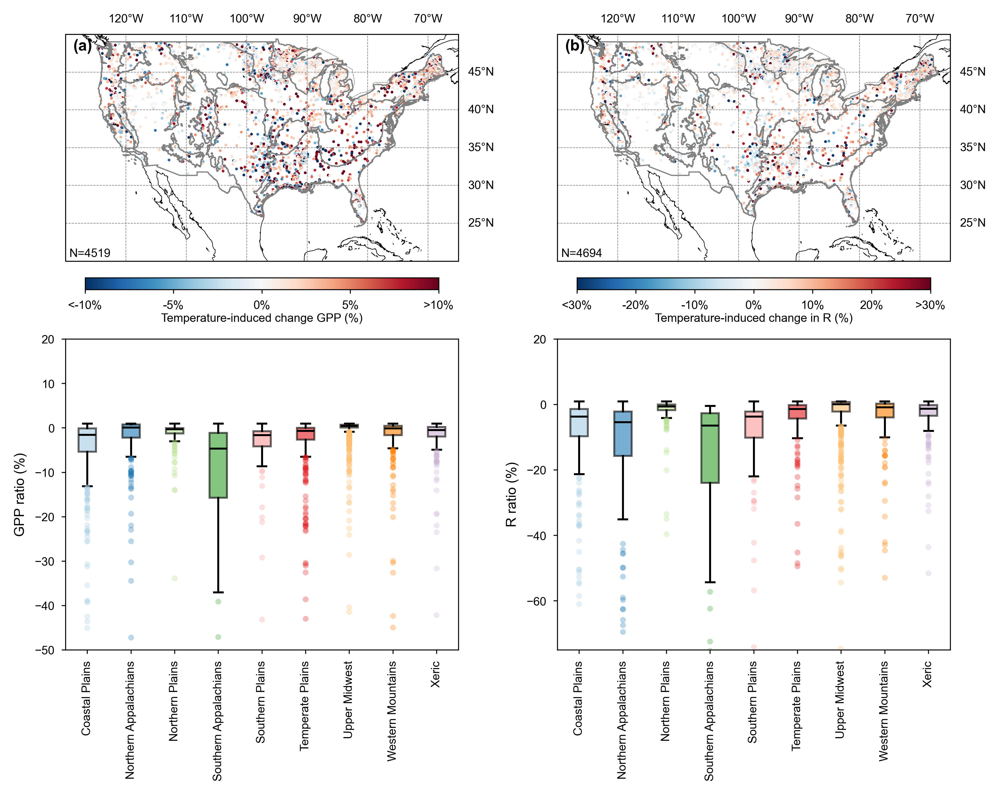

In [87]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
import matplotlib.ticker as mtick
import cartopy.feature as cfeature

# 筛选 P > 0.05 的点（不显著）
gpp_mask = final_merged_MLDT['GPP_p'] > 0.05
r_mask = final_merged_MLDT['R_p'] > 0.05

gpp_data = final_merged_MLDT[gpp_mask].copy()
r_data = final_merged_MLDT[r_mask].copy()

# 设置色带范围，限制为 -10 到 10 和 -30 到 30
norm = TwoSlopeNorm(vmin=-10, vcenter=0, vmax=10)
norm2 = TwoSlopeNorm(vmin=-30, vcenter=0, vmax=30)

# 设置画布
fig = plt.figure(figsize=(7, 6), dpi=500,constrained_layout=True)

# 使用 subplot_mosaic 设置子图布局
axdict = fig.subplot_mosaic(
    """
    AB
    CD
    """,
    per_subplot_kw={
        'A': {'projection': ccrs.PlateCarree()},
        'B': {'projection': ccrs.PlateCarree()}}
)

# --- A: GPP_ratio ---
ax1 = axdict['A']
ax1.set_extent([-130, -65, 20, 50], crs=ccrs.PlateCarree())  # 设置地图范围
ax1.coastlines(resolution='10m', linewidth=0.3)  # 添加海岸线
ax1.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.3)  # 添加国界线
gridlines1 = ax1.gridlines(draw_labels=True, color='gray', linestyle='--', linewidth=0.3)  # 添加网格线
gridlines1.bottom_labels = False
gridlines1.left_labels = False
gridlines1.xlabel_style = {'size': 6}
gridlines1.ylabel_style = {'size': 6}
eco.boundary.plot(
                ax=ax1,
                edgecolor='gray',
                linewidth=0.6,
                transform=ccrs.PlateCarree(),
                zorder=2
            )
# 添加 (a) 标签
ax1.text(0.02, 0.98, '(a)', transform=ax1.transAxes, fontsize=8, fontweight='bold', va='top', ha='left')

sc1 = ax1.scatter(
    gpp_data['Pour_long'], gpp_data['Pour_lat'],
    c=gpp_data['GPP_ratio'], cmap='RdBu_r', norm=norm,
    s=2, edgecolors='none', transform=ccrs.PlateCarree()
)
ax1.text(0.01, 0.02, f'N={len(gpp_data)}', transform=ax1.transAxes, fontsize=6)

# colorbar
cbar1 = fig.colorbar(sc1, ax=ax1, orientation='horizontal', pad=0.05, shrink=0.9, aspect=30)
cbar1.set_label('Temperature-induced change GPP (%)', fontsize=6, labelpad=1)
cbar1.ax.tick_params(labelsize=6, length=2)
cbar1.ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100, decimals=0))
cbar1.set_ticks([-10, -5, 0, 5, 10])
cbar1.set_ticklabels(['<-10%', '-5%', '0%', '5%', '>10%'])

# --- B: R_ratio ---
ax2 = axdict['B']
ax2.set_extent([-130, -65, 20, 50], crs=ccrs.PlateCarree())  # 设置地图范围
ax2.coastlines(resolution='10m', linewidth=0.3)  # 添加海岸线
ax2.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.3)  # 添加国界线
gridlines2 = ax2.gridlines(draw_labels=True, color='gray', linestyle='--', linewidth=0.3)  # 添加网格线
gridlines2.bottom_labels = False
gridlines2.left_labels = False
gridlines2.xlabel_style = {'size': 6}
gridlines2.ylabel_style = {'size': 6}
eco.boundary.plot(
                ax=ax2,
                edgecolor='gray',
                linewidth=0.6,
                transform=ccrs.PlateCarree(),
                zorder=2
            )
# 添加 (b) 标签
ax2.text(0.02, 0.98, '(b)', transform=ax2.transAxes, fontsize=8, fontweight='bold', va='top', ha='left')

sc2 = ax2.scatter(
    r_data['Pour_long'], r_data['Pour_lat'],
    c=r_data['R_ratio'], cmap='RdBu_r', norm=norm2,
    s=2, edgecolors='none', transform=ccrs.PlateCarree()
)
ax2.text(0.01, 0.02, f'N={len(r_data)}', transform=ax2.transAxes, fontsize=6)

# colorbar
cbar2 = fig.colorbar(sc2, ax=ax2, orientation='horizontal', pad=0.05, shrink=0.9, aspect=30)
cbar2.set_label('Temperature-induced change in R (%)', fontsize=6, labelpad=1)
cbar2.ax.tick_params(labelsize=6, length=2)
cbar2.ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100, decimals=0))
cbar2.set_ticks(range(-30, 35, 10))  # Set ticks with a step of 10
cbar2.set_ticklabels([f'{i}%' if i != -30 and i != 30 else (f'{"<" if i < 0 else ">"}{abs(i)}%') for i in range(-30, 35, 10)])  # Custom tick labels for two ends

# # 筛选数据（显著性）
sig_gpp_ratio = lakes_with_ecoregion[(lakes_with_ecoregion['GPP_ratio'] < 1) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]
sig_r_ratio = lakes_with_ecoregion[(lakes_with_ecoregion['R_ratio'] < 1) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]
# sig_peak_nep = lakes_with_ecoregion[(lakes_with_ecoregion['NEP_peak_p'] < 0.05) & (~lakes_with_ecoregion['WSA9_NAME'].isna())]

# 共用前10个生态区
groups = sorted(sig_peak_gpp['WSA9_NAME'].unique())[:10]
positions = np.arange(1, len(groups) + 1)
# # # c 子图：GPP
plot_slope_box_by_ecoregion(
     axdict["C"],  sig_gpp_ratio , 'GPP_ratio', groups, ecoregion_colors,
                            'GPP ratio (%)', 'j')
axdict["C"].set_ylim(-50,20)

plot_slope_box_by_ecoregion(
     axdict["D"],  sig_r_ratio , 'R_ratio', groups, ecoregion_colors,
                            'R ratio (%)', 'j')
axdict["D"].set_ylim(-75,20)
# plt.savefig(r'GPP_NA_FIG_6_NC.PNG', dpi=300)
# plt.savefig(r'GPP_NA_FIG_6_NC.pdf', dpi=500,bbox_inches='tight')
# plt.savefig(r'GPP_NA_FIG_6_NC.jpg', dpi=500,bbox_inches='tight')
plt.savefig('FIG6_NC_f.pdf', dpi=600, bbox_inches='tight', transparent=True)
plt.savefig('FIG6_NC_f.jpg', dpi=600, bbox_inches='tight', transparent=True)
# 展示图像
plt.show()